In [2]:
import Pkg; Pkg.add("ForwardDiff")

    Updating registry at `C:\Users\AllanStruthers\.julia\registries\General`
┌ Info: The General registry is installed via git. Consider reinstalling it via
│ the newer faster direct from tarball format by running:
│   pkg> registry rm General; registry add General
└ 
    Updating git-repo `https://github.com/JuliaRegistries/General.git`
   Resolving package versions...
   Installed ForwardDiff ─ v1.2.1
    Updating `C:\Users\AllanStruthers\.julia\environments\v1.11\Project.toml`
  [f6369f11] + ForwardDiff v1.2.1
    Updating `C:\Users\AllanStruthers\.julia\environments\v1.11\Manifest.toml`
  [f6369f11] ↑ ForwardDiff v1.1.0 ⇒ v1.2.1
Precompiling project...
   3370.9 ms  ✓ ForwardDiff
    943.9 ms  ✓ ForwardDiff → ForwardDiffStaticArraysExt
  2 dependencies successfully precompiled in 16 seconds. 454 already precompiled.
  2 dependencies precompiled but different versions are currently loaded. Restart julia to access the new versions. Otherwise, loading dependents of these packages may 

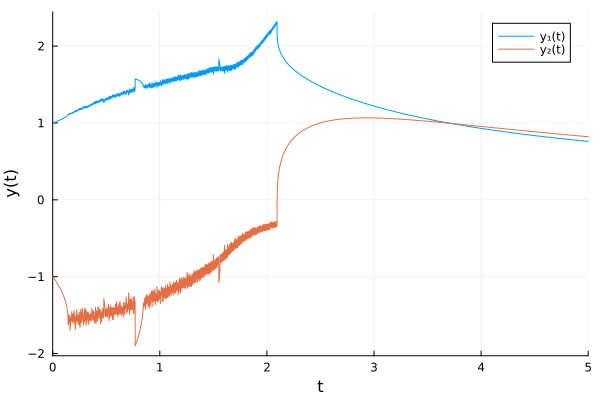

In [3]:
using DifferentialEquations
using ForwardDiff

# Example vector-valued function h(y,t): R^n × R → R^n
function h(y, t)
    # simple nonlinear system with explicit time dependence
    return [
        y[1]^2 + t*y[2],
        sin(y[2]) + t*y[1]
    ]
end

# A(y,t) = Jacobian wrt y (matrix)
function A(y, t)
    return ForwardDiff.jacobian(yy -> h(yy, t), y)
end

# f(y,t) = ∂h/∂t (vector)
function f(y, t)
    n = length(h(y,t))
    ft = similar(y)
    for i in 1:n
        ft[i] = ForwardDiff.derivative(tt -> h(y, tt)[i], t)
    end
    return ft
end

# Define the ODE system: y'(t) = -A(y,t)^{-1} f(y,t)
function ode!(dy, y, p, t)
    Ay = A(y, t)
    ft = f(y, t)
    dy[:] = -Ay \ ft
end

# Initial condition and timespan
y0 = [1.0, -1.0]
tspan = (0.0, 5.0)

# Solve ODE
prob = ODEProblem(ode!, y0, tspan)
sol = solve(prob, Tsit5())

using Plots
plot(sol, xlabel="t", ylabel="y(t)", label=["y₁(t)" "y₂(t)"])


Below is a mass-matrix variant that should be better near any singularities in A. 

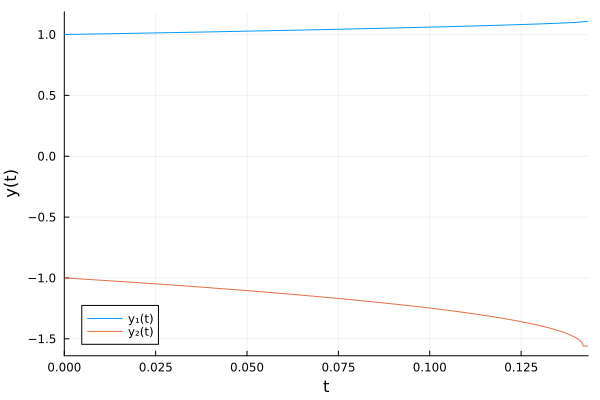

In [6]:
using DifferentialEquations, Sundials
using ForwardDiff

# Example vector-valued function h(y,t): R^n × R → R^n
function h(y, t)
    return [
        y[1]^2 + t*y[2],
        sin(y[2]) + t*y[1]
    ]
end

# A(y,t) = Jacobian wrt y (matrix)
function A(y, t)
    return ForwardDiff.jacobian(yy -> h(yy, t), y)
end

# f(y,t) = ∂h/∂t (vector)
function f(y, t)
    n = length(h(y,t))
    ft = similar(y)
    for i in 1:n
        ft[i] = ForwardDiff.derivative(tt -> h(y, tt)[i], t)
    end
    return ft
end

# Residual form: A(y,t)*dy + f(y,t) = 0
function dae_residual!(res, dy, y, p, t)
    res[:] = A(y, t) * dy + f(y, t)
end

# Initial condition
y0 = [1.0, -1.0]

# Need a consistent initial derivative dy0 satisfying A(y0,t0)*dy0 + f(y0,t0) = 0
t0 = 0.0
dy0 = -A(y0,t0) \ f(y0,t0)

# Problem setup
tspan = (0.0, 5.0)
prob = DAEProblem(dae_residual!, dy0, y0, tspan)

# Solve
sol = solve(prob, IDA())   # IDA = Sundials DAE solver

using Plots
plot(sol, xlabel="t", ylabel="y(t)", label=["y₁(t)" "y₂(t)"])


Avoiding the loop in the defn of the RHS.  It makes sense but looks a smidge funky.

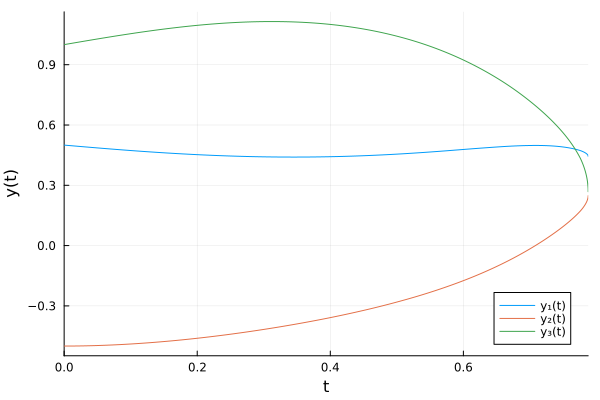

In [7]:
using DifferentialEquations
using ForwardDiff
using Sundials
using Plots

# Example nonlinear vector-valued function h: R^3 × R → R^3
function h(y, t)
    return [
        sin(y[1]) + t * y[2]^2,
        exp(y[2]) + y[1]*y[3] + cos(t),
        y[1]^2 - y[2]*y[3] + t^2
    ]
end

# Jacobian wrt y: A(y,t)
A(y, t) = ForwardDiff.jacobian(yy -> h(yy, t), y)

# Partial wrt t: f(y,t)
f(y, t) = ForwardDiff.jacobian(tt -> h(y, tt[1]), [t])[:, 1]

# Residual form for DAE: A(y,t)*dy + f(y,t) = 0
function dae_residual!(res, dy, y, p, t)
    res[:] = A(y, t) * dy + f(y, t)
end

# Initial condition
y0 = [0.5, -0.5, 1.0]
t0 = 0.0

# Compute consistent dy0
dy0 = -A(y0,t0) \ f(y0,t0)

# Problem setup
tspan = (0.0, 10.0)
prob = DAEProblem(dae_residual!, dy0, y0, tspan)

# Solve with IDA (from Sundials)
sol = solve(prob, IDA())

# Plot results
plot(sol, xlabel="t", ylabel="y(t)", label=["y₁(t)" "y₂(t)" "y₃(t)"])


I forgot that ForwardDiff does not do Complex!  It is a smidge messy to do this but here goes.

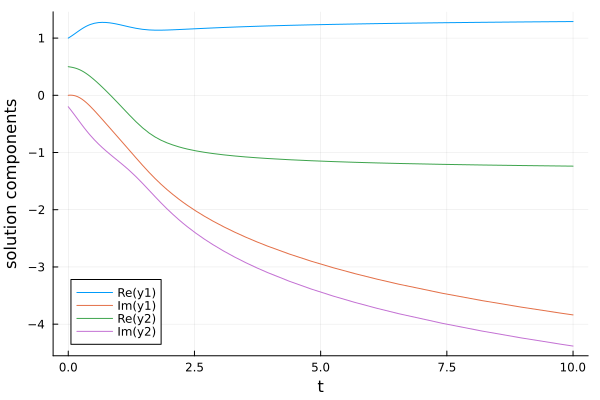

In [11]:
using DifferentialEquations
using ForwardDiff
using Sundials
using Plots

# helpers: convert complex <-> real vectors
complex_to_real(y) = vcat(real.(y), imag.(y))
real_to_complex(x) = complex.(x[1:Int(length(x)÷2)], x[Int(length(x)÷2)+1:end])

# Example complex-valued h(y,t) in 2D
function h_real(x, t)
    # x = [a1, a2, b1, b2]  where y1 = a1 + i b1, y2 = a2 + i b2
    n = length(x) ÷ 2
    a = view(x, 1:n)
    b = view(x, n+1:2n)

    a1, a2 = a[1], a[2]
    b1, b2 = b[1], b[2]

    # component 1: exp(i*y1) + t*y2
    h1_re = exp(-b1) * cos(a1) + t * a2
    h1_im = exp(-b1) * sin(a1) + t * b2

    # component 2: sin(y2) + i*t*y1
    h2_re = sin(a2) * cosh(b2) - t * b1
    h2_im = cos(a2) * sinh(b2) + t * a1

    return [h1_re, h2_re, h1_im, h2_im]  # standard Julia vector
end

# Jacobian wrt x
A_real(x, t) = ForwardDiff.jacobian(xx -> h_real(xx, t), x)

# Partial wrt t
f_real(x, t) = ForwardDiff.jacobian(tt -> h_real(x, tt[1]), [t])[:, 1]

# DAE residual: A*dx + f = 0
function dae_residual!(res, dx, x, p, t)
    res[:] = A_real(x, t) * dx + f_real(x, t)
end

# Initial complex state
y0c = [1.0 + 0.0im, 0.5 - 0.2im]
x0 = complex_to_real(y0c)

t0 = 0.0
dx0 = -A_real(x0, t0) \ f_real(x0, t0)

tspan = (0.0, 10.0)
prob = DAEProblem(dae_residual!, dx0, x0, tspan)

# Solve using IDA from Sundials
sol = solve(prob, IDA())

# Convert solution back to complex
yc_sol = [real_to_complex(u) for u in sol.u]

# Plot real & imaginary parts
ts = sol.t
y1c = first.(yc_sol)
y2c = last.(yc_sol)

plot(ts, real.(y1c), label="Re(y1)")
plot!(ts, imag.(y1c), label="Im(y1)")
plot!(ts, real.(y2c), label="Re(y2)")
plot!(ts, imag.(y2c), label="Im(y2)")
xlabel!("t")
ylabel!("solution components")